Welcome to our CCS-Lab server. Working on this notebook on our server makes data sharing etc. much more easy.

In [1]:
import shutil

import pandas as pd
import requests
from gensim.models import KeyedVectors
import json
import numpy as np
import pickle
import os

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as patchesb
import seaborn as sns

from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity

import gspread
from gspread_dataframe import get_as_dataframe, set_with_dataframe
from google.oauth2 import service_account # based on google-auth library

In [2]:
#file_data = json.load(open(os.path.expanduser("~/ServiceAccountsKey.json"))) # load your ServiceAccountsKey file
#credentials = service_account.Credentials.from_service_account_info(file_data) # extract the credentials from it
#scoped_credentials = credentials.with_scopes(['https://spreadsheets.google.com/feeds', 'https://www.googleapis.com/auth/drive']) # specify your usage of the credentials
# gc = gspread.Client(auth=scoped_credentials) # use the constrained credentials for authentication of gspread package
# noscemus_gs = gc.open_by_url(["https://docs.google.com/spreadsheets/d/1ekf9RBfd4yqy0p0IWJ4SDk1kUT70hnoIVX1H6KPdIts/edit?usp=sharing")

On the server, there is a shared folder with various important data. In terminal, you can list its content using `ls /srv`. In python, we have an analogical method:

In [3]:
os.listdir("/srv")

['venvs', 'models', 'data']

* `venvs` directory contains preconfigured python environments, such as `latin_global_venv`, which we also use within this notebooks
* `models` directory contains models, such as the Latin BERT, with some modifications we did within the TOME project
* `data` directory contains various datasets

For instance, `/srv/data/tome/noscemus/` dir contains all noscemus related data files and folders we will use below.

In [10]:
os.listdir("/srv/data/tome/noscemus/")

['noscemus_raw',
 'NOSCEMUS FULL',
 'lemmatized_sents',
 'filtered_vocab_df.json',
 'sents_data_lower',
 'vectors',
 'NOSCEMUS_FULL.zip',
 'metadata_table_long.csv',
 'sents_data']

This will be our `source_path` from which we will read all our data files

In [6]:
source_path = "/srv/data/tome/noscemus/"

Let's start by loading our vocabulary data.

## Inspecting noscemus vocabularies

These vocabularies are crucial, since they were used for training the vectors used below. They come from [this](https://github.com/CCS-ZCU/noscemus_ETF/blob/master/scripts/7_vocabs%26lila-embeddings.ipynb) notebook.

In [7]:
filtered_vocab_df = pd.read_json(source_path + "filtered_vocab_df.json")
filtered_vocab_df.head(20)

,word,1501-1550,1551-1600,1601-1650,1651-1700,mean,in_lila_embeddings,in_lasla,in_operamaiora,transl
3299,dico,43255,122549,42457,72224,70121.25,True,True,True,"say, call, tell"
960,pars,33225,93059,44337,52385,55751.50,True,True,True,part
3871,possum,25029,82700,38391,76841,55740.25,True,True,True,"be able, can"
6039,habeo,31690,89199,39443,59770,55025.50,True,True,True,"have, hold, possess, consider, think"
2898,facio,31814,98524,36944,51438,54680.00,True,True,True,"do, make, handle"
5630,liber,39559,65900,38496,53100,49263.75,True,True,True,"book, volume, inner bark of a tree, book, book"
4259,res,29069,70669,28291,51565,44898.50,True,True,True,suddenly
1219,uideo,21536,59099,26372,50503,39377.50,True,True,True,
5787,locus,23102,56782,31421,43680,38746.25,True,True,True,"place, location"
1257,corpus,16979,63171,22871,31938,33739.75,True,True,True,"body, corpus"


In [8]:
len(filtered_vocab_df)

6005

In [9]:
# generate a simple dictiory from the columns "word" and "transl"
word_transl_dict = dict(zip(filtered_vocab_df["word"], filtered_vocab_df["transl"]))
# get a translation for any particular word...
word_transl_dict["magnus"]

'big'

In [10]:
# filter for rows with lemmata containing certain character ngrams, such as "equa"
filtered_vocab_df[filtered_vocab_df["word"].str.contains("equa")]

,word,1501-1550,1551-1600,1601-1650,1651-1700,mean,in_lila_embeddings,in_lasla,in_operamaiora,transl
4021,aequalis,6342,21313,14968,17950,15143.25,True,True,True,"equal, similar, uniform, level, flat, of the s..."
6071,aequator,1133,1723,2795,4088,2434.75,False,False,False,equator
6005,inaequalis,717,2228,1505,1615,1516.25,True,True,True,"uneven, unequal, not smooth/level (surface), i..."
2944,inaequalitas,695,899,803,1336,933.25,True,True,True,"irregularity of shape/distribution, patchiness..."
4725,aequalitas,380,1509,735,1077,925.25,True,True,True,"evenness, equality (of age/status/merit/distri..."
3016,sequax,148,135,109,106,124.50,True,True,True,"that follows closely/eagerly, addicted, pliant..."
105,nequam,19,75,38,58,47.50,True,True,True,"bad, worst"


In [11]:
# or look at specific word
filtered_vocab_df[filtered_vocab_df["word"]=="cor"]

,word,1501-1550,1551-1600,1601-1650,1651-1700,mean,in_lila_embeddings,in_lasla,in_operamaiora,transl
2171,cor,10583,17460,5876,11425,11336.0,True,True,True,"heart, mind, soul"


In [12]:
# our periods
periods_str = filtered_vocab_df.columns[1:5]
periods_str

Index(['1501-1550', '1551-1600', '1601-1650', '1651-1700'], dtype='object')

## Exploring vectors

In [13]:
with open(source_path + "/vectors/vectors_dict_comp.pkl", "rb") as file:
    vectors_dict = pickle.load(file)

`vectors_dict` is a dictionary object with six keys, each representing one subcorpus.

In [14]:
vectors_dict.keys()

dict_keys(['lasla', 'operamaiora', '1501-1550', '1551-1600', '1601-1650', '1651-1700'])

The value of the key-value pairs are designed as `KeyedVectors` objects of the Gensim library , what offers a lot of analytical possibilities (see the [docs](https://radimrehurek.com/gensim/models/keyedvectors.html)). 

Thus, to access vectors for the "1501-1550" subcorpus, you start your query with `vectors_dict["1501-1550"]` etc.

To extract the numerical values of all vectors at once as a matrix, you can run `vectors_dict["1501-1550"].vectors`. The following command give you the shape of this matrix:

In [15]:
vectors_dict["1501-1550"].vectors.shape

(6005, 100)

So we see we have a matrix with 6005 rows and 100 columns. The 6005 tows correspond to individual words in the vocabulary, the 100 columns to the vector dimensions.  

The subsequent analyses  are based on comparison of these row vectors. The assumption is that words with more similar vectors are also semantically more similar to each other. In that respect, synonyms tend to have almost identical vectors (Since their context of usage is interchangible, the model has a problem to distinguish between them during the training, and therefore assigns them similar probabilistic weights, which we interpret as their vector representations at the end.

The vector representation as such is not that much informative. But let print one for demonstration:

In [16]:
vectors_dict["1501-1550"]["scientia"]

array([ 0.07131752, -0.05100204,  0.1962502 , -0.20194902,  0.04310113,
       -0.4700006 ,  0.00836676, -0.23308606,  0.03064469,  0.03834176,
        0.0606149 , -0.26381615, -0.14734592, -0.00957918,  0.054674  ,
       -0.18551935, -0.17536096,  0.6310937 ,  0.12017379, -0.5268528 ,
        0.4504412 ,  0.22025323,  0.3395959 ,  0.65702224,  0.14512597,
       -0.01293217,  0.01740456, -0.251487  , -0.23271556, -0.01947493,
        0.09961059, -0.0175744 , -0.03683989, -0.27297142, -0.16304745,
       -0.130969  ,  0.5143931 , -0.03385988, -0.2162963 ,  0.15085046,
       -0.01935843, -0.03495626, -0.44701257, -0.4265077 ,  0.3400892 ,
       -0.08311147,  0.10781249, -0.11356457, -0.09472778, -0.21049877,
       -0.0966019 , -0.15098424, -0.22866412,  0.06186397,  0.09088764,
       -0.02042022, -0.4507903 , -0.21266498,  0.29603788,  0.00842794,
       -0.37245417,  0.23017997,  0.15661542,  0.0374593 , -0.04280396,
       -0.08799439, -0.06174525,  0.35864368, -0.41121757, -0.24

In [17]:
vectors_dict["1501-1550"]["geometria"]

array([ 0.5790321 , -0.13226064,  0.02034605, -0.05052697, -0.25103042,
       -0.3789513 , -0.48242885, -0.06094532,  0.07639147, -0.4699228 ,
        0.08952635,  0.32738948, -0.25833148,  0.08875088,  0.3172829 ,
       -0.19975166, -0.04965947,  0.68608254,  0.3870294 , -1.1597716 ,
        0.39530346, -0.46887287, -0.1979102 ,  0.9700426 ,  0.09045822,
        0.08267152,  0.3590514 , -0.16714379, -0.02275665, -0.02209213,
        0.19595405, -0.21634099,  0.37490898, -0.4104424 ,  0.05533295,
       -0.03968274,  0.49761644, -0.07361758,  0.29151055, -0.17498915,
       -0.25863603, -0.05152465, -0.0787554 , -0.21571004, -0.01660638,
       -0.39926258,  0.1701007 , -0.1491356 , -0.00535037, -0.16908619,
        0.40024465, -0.08601458, -0.27285823, -0.028415  ,  0.5238833 ,
       -0.25592044, -0.37442425, -0.14141244,  0.31836417, -0.23103814,
       -0.04178654,  0.6397155 ,  0.24777302, -0.15426943,  0.11866014,
        0.18327999, -0.03060278,  0.2912874 , -0.26340765, -0.19

## Comparing two words


Since we rely on the `KeyedVectors` data structure, we can compare vector representations of two words in a very straightforward way. 

In [50]:
vectors_dict["1551-1600"].similarity("cor", "spiritus")

0.63516825

Compare it against another pair...

In [53]:
vectors_dict["1551-1600"].similarity("cor", "anima")

0.570464

Or compare it againts another period:

In [54]:
vectors_dict["1601-1650"].similarity("cor", "spiritus")

0.60549015

However, these absolute numbers have to be interpreted carefully, especially when doing a comparison across subcorpora, considering that the absolute similarity values are influenced by respective sizes of the subcorpora used for training.

In [60]:
print("avg. sim. to cor in 1551-1600: " + str(np.mean([tup[1] for tup in vectors_dict["1551-1600"].most_similar("cor", topn=6005)])))
print("avg. sim. to cor in 1601-1650: " + str(np.mean([tup[1] for tup in vectors_dict["1601-1650"].most_similar("cor", topn=6005)])))

avg. sim. to cor in 1551-1600: 0.22117465102337308
avg. sim. to cor in 1601-1650: 0.20531048460775095


These numbers show average cosine similarity values of the cor toward all other words in the dictionary. We see that the avarage value is lower in the later period, what corresponds to the fact that the later subscorpus is substantially smaller.

To deal with this issue, Gensim natively support relative similarity measurements.





In [64]:
vectors_dict["1551-1600"].relative_cosine_similarity("cor", "spiritus")

0.10411797392820756

In [65]:
vectors_dict["1601-1650"].relative_cosine_similarity("cor", "spiritus")

0.09753128436621873

In this case, the trend is still the same. 

We will now define our own function, which weight the absolute cosine similarity values by values from the 10 other terms with the highest similarity scores.

In [97]:
def get_weighted_similarity(target1, target2):
    weighted_sims = []
    for key in vectors_dict.keys():
        # calculate average similarity value of ten most similar vectors for both target terms
        nn_avr = np.mean([tup[1] for tup in vectors_dict[key].most_similar(target1)] + [tup[1] for tup in vectors_dict[key].most_similar(target2)])
        # calculate ordinary similarity between the two terms:
        similarity = vectors_dict[key].similarity(target1, target2)
        # caluculate weighted similarity of the two term
        weighted_sim = similarity / nn_avr
        weighted_sims.append({
            "key" : key,
            "weighted_sim" : weighted_sim
        })
    weighted_sims_df = pd.DataFrame(weighted_sims)
    return weighted_sims_df

In [98]:
targets = ["cor", "spiritus"]
weighted_sims_df = get_weighted_similarity(targets[0], targets[1])
weighted_sims_df

,key,weighted_sim
0,lasla,0.537824
1,operamaiora,0.664804
2,1501-1550,1.017683
3,1551-1600,1.030573
4,1601-1650,1.009155
5,1651-1700,0.791517


In [99]:
# let's use another example for a moment
targets = ["scientia", "geometria"]
weighted_sims_df = get_weighted_similarity(targets[0], targets[1])
weighted_sims_df

,key,weighted_sim
0,lasla,0.726425
1,operamaiora,0.819293
2,1501-1550,0.979341
3,1551-1600,1.023939
4,1601-1650,1.023071
5,1651-1700,1.035083


## Getting nearest neighbors

Another important functionality is the possibility to extract *n* of  words with the most similar vectors to a *target* word. In terms of linear algebra, these are vectors which are nearest to the target term in the vector space. Therefore, they are sometimes called *nearest neighbors*. (REMINDER: This does not mean that these terms co-occur with each other in the texts.) This is the method behind our interactive visualizations as well. You can modify the `topn` argument to get either less or more words.


In [95]:
vectors_dict["1551-1600"].most_similar("cor", topn=20)

[('cerebrum', 0.6569346785545349),
 ('uitalis', 0.6568419337272644),
 ('pulmo', 0.6411842107772827),
 ('spiritus', 0.6351682543754578),
 ('animalis', 0.6250706911087036),
 ('membrum', 0.6148609519004822),
 ('uiscus', 0.5740099549293518),
 ('iecur', 0.570853590965271),
 ('anima', 0.5704639554023743),
 ('pectus', 0.5550786852836609),
 ('neruus', 0.5547391772270203),
 ('pulso', 0.551264762878418),
 ('functio', 0.550322949886322),
 ('uentriculus', 0.5498640537261963),
 ('actio', 0.5377834439277649),
 ('innascor', 0.5375120639801025),
 ('facultas', 0.5336770415306091),
 ('affectus', 0.5326187014579773),
 ('corpus', 0.5310049057006836),
 ('por', 0.5297876596450806)]

In [96]:
vectors_dict["1651-1700"].most_similar("cor", topn=20)

[('uentriculus', 0.6637424826622009),
 ('iecur', 0.6248419880867004),
 ('sanguis', 0.6211534142494202),
 ('pulmo', 0.6176689267158508),
 ('uitalis', 0.600404679775238),
 ('cerebrum', 0.5918862223625183),
 ('lien', 0.58487868309021),
 ('pectus', 0.5703794360160828),
 ('ren', 0.5662998557090759),
 ('ceruix', 0.5425133109092712),
 ('stomachus', 0.5396749377250671),
 ('uiscus', 0.5279808640480042),
 ('pus', 0.51910400390625),
 ('os', 0.5157352089881897),
 ('uena', 0.5059788823127747),
 ('fel', 0.5028825998306274),
 ('leo', 0.5001087784767151),
 ('neruus', 0.49892735481262207),
 ('anima', 0.4974350333213806),
 ('no', 0.49734827876091003)]

We define a function to extract *n* nearest neighbors for all subcorpora at once.

In [18]:
def get_table_of_nns(target, topn=20, to_csv=False):
    most_similar_by_per = {}
    for key in vectors_dict.keys():
        try:
            nns = [tup[0] for tup in vectors_dict[key].most_similar(target, topn=topn)]
        except:
            nns = [None] * topn
        most_similar_by_per[key] = nns
    most_similar_df = pd.DataFrame(most_similar_by_per)
    if to_csv:
        filename = target + "_nns.csv"
        most_similar_df.to_csv(filename, index=False)
    return most_similar_df

In [105]:
target = "cor"
get_table_of_nns(target)

,lasla,operamaiora,1501-1550,1551-1600,1601-1650,1651-1700
0,depascor,tuus,pulmo,cerebrum,sanguis,uentriculus
1,indecor,osoris,uitalis,uitalis,pulmo,iecur
2,nidor,interior,spiritus,pulmo,iecur,sanguis
3,nugor,inscrutabilis,uentriculus,spiritus,uentriculus,pulmo
4,reminiscor,renes,uena,animalis,cerebrum,uitalis
5,canidia,expando,cerebrum,membrum,spiritus,cerebrum
6,olor,purifico,iecur,uiscus,uitalis,lien
7,obirascor,praepedio,membrum,iecur,pectus,pectus
8,corusco,labium,uenalis,anima,animalis,ren
9,corpus,anterior,por,pectus,membrum,ceruix


In [21]:
target = "scientia"
get_table_of_nns(target)

,lasla,operamaiora,1501-1550,1551-1600,1601-1650,1651-1700
0,inscientia,scibilis,cognitio,mathematica,cognitio,mathematica
1,experientia,scio,mathematica,cognitio,philosophia,cognitio
2,sapientia,scientificus,philosophia,philosophia,disciplina,disciplina
3,prudentia,nescientia,disciplina,disciplina,mathematica,notitia
4,conscientia,producibilis,ars,ars,geometria,geometria
5,intelligentia,cognitio,doctrina,geometria,notitia,doctrina
6,elegantia,indemonstrabilis,sapientia,dialecticus,ars,ars
7,prouidentia,reducibilis,necessarius,sapientia,doctrina,philosophia
8,indigentia,speculatiuus,mathematicus,ueritas,ueritas,peritia
9,artificium,demonstrabilis,geometria,doctrina,theologia,studiosus


In [127]:
vectors_dict["1651-1700"].most_similar("regina") # masculus, masculinus 

[('rex', 0.748123288154602),
 ('suecia', 0.7230528593063354),
 ('filia', 0.721136748790741),
 ('soror', 0.7001640796661377),
 ('philippus', 0.6955680251121521),
 ('carolus', 0.6934331059455872),
 ('princeps', 0.6859647035598755),
 ('regius', 0.6639686226844788),
 ('frater', 0.6637593507766724),
 ('fridericus', 0.6613724231719971)]

You can also do interesting vector arithmentic: 

In [135]:
# Check the "most similar words", using the default "cosine similarity" measure.
result = vectors_dict["1651-1700"].most_similar(positive=['femina', 'rex'], negative=['uir']) # masculus, masculinus 
most_similar_key, similarity = result[0]  # look at the first match
print(f"{most_similar_key}: {similarity:.4f}")

concubina: 0.5532


In [134]:
#set_with_dataframe(noscemus_gs.add_worksheet("nns_equus_v1", 1,1), nns_equus)

In [107]:
# for those of us who welcome translations...
#target = "scientia"
#topn=10
#most_similar_by_per = {}
# for subcorpus in vectors_dict.keys():
#    nns= nn_tups_to_transl(vectors_dict[subcorpus].most_similar(target, topn=topn), shorten_transl=False)
#    most_similar_by_per[subcorpus] = nns
#nns_fecundus = pd.DataFrame(most_similar_by_per)
#nns_fecundus

## Projections into 2D/3D space

An important family of algorithms from algebra allows to reduce vector dimensionality while minimalizing information loss. A famous and popular one is called [t-distributed stochastic neighbor embedding](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding): You give a list of multidimensional vectors on input and get a list of lower dimensional (e.g. 3d or 2D) vectors on output. 

The algorithm is stochastic. Therefore, in each run, you get slightly different results (if you don't specify a random *seed*). However, the relative proximities should be kept.

This method is commonly used for obtaining *x*, *y*, and *z* coordinates used for plotting the words. 

In [108]:
def get_tsne_coors(kv, perplexity=18):
    # inverse similarity to distance
    #data = (1 - sim_matrix) / 1
    words = np.array(kv.index_to_key)
    #data.round(5)
    # tSNE to project all words into a 2-dimensional space
    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity, metric='cosine', max_iter=1000) # dissimilarity="precomputed",
    #tsne = TSNE(n_components=2, random_state=42, perplexity=18, metric='precomputed', n_iter=5000) # dissimilarity="precomputed",
    pos = tsne.fit_transform(kv.vectors) # project all points into space
    xs, ys = pos[:, 0], pos[:, 1]
    # extract minimal and maximal values
    minmax = [pos[:, 0].min(), pos[:, 0].max(), pos[:, 1].min(), pos[:, 1].max()]
    # normalize on scale from 0 to 1
    xs = (xs - minmax[0]) / (minmax[1] - minmax[0])
    ys = (ys - minmax[2]) / (minmax[3] - minmax[2])
    return xs, ys, words

In [109]:
%%time
# get coordinates for all vectors for all figures below...
coordinates_dict = {}
for key in vectors_dict.keys():
    xs, ys, words = get_tsne_coors(vectors_dict[key])
    coordinates_dict[key] = (xs, ys, words)

CPU times: user 2min 39s, sys: 31.6 s, total: 3min 11s
Wall time: 2min 32s


Once obtained, here you can inspect coordinates for individual word.

In [136]:
target = "scientia"
i = np.where(words == target) # find the positional index
x, y = xs[i], ys[i] # apply the positional index to navigate through xs and ys
print(x, y)

[0.1441919] [0.37274155]


The same can be extended for 3D

In [137]:
def get_tsne_coors_d3(kv, perplexity=18):
    words = np.array(kv.index_to_key)
    tsne = TSNE(n_components=3, random_state=42, perplexity=perplexity, metric='cosine', max_iter=1000) # dissimilarity="precomputed",
    pos = tsne.fit_transform(kv.vectors) # project all points into space
    xs, ys, zs = pos[:, 0], pos[:, 1], pos[:, 2]
    # extract minimal and maximal values
    minmax = [pos[:, 0].min(), pos[:, 0].max(), pos[:, 1].min(), pos[:, 1].max(), pos[:, 2].min(), pos[:, 2].max()]
    # normalize on scale from 0 to 1
    xs = (xs - minmax[0]) / (minmax[1] - minmax[0])
    ys = (ys - minmax[2]) / (minmax[3] - minmax[2])
    zs = (zs - minmax[4]) / (minmax[5] - minmax[4])
    return xs, ys, zs, words

In [140]:
# %%time
# to get coordinates for all vectors for all figures below...
# takes time, apply carefully!
#coordinates3d_dict = {}
#for key in vectors_dict.keys():
#    xs, ys, zs, words = get_tsne_coors_d3(vectors_dict[key])
#    coordinates3d_dict[key] = (xs, ys, zs, words)

In [141]:
#with open("../data/coordinates3d_dict.pkl", "wb") as file:
#    pickle.dump(coordinates3d_dict, file)

In [142]:
# wordlist = [tup[0] for tup in vectors_dict["1651-1700"].most_similar("scientia", topn=100)]

In [143]:
#with open("../data/wordlist.json", "w") as file:
#    json.dump(wordlist, file)

In [157]:
# for better visibility, generate random colors
def rand_col(seed=0):
    np.random.seed(seed=seed)
    color = np.random.randint(0, 180, size=3)
    color = np.round(color / 256, 2)
    return tuple(color)

In [145]:
def draw_special_words(ax, wordlist, color="random_color", rotation=True, fontsize=10):
    idx = [word[0] for word in enumerate(words) if word[1] in wordlist]
    if isinstance(color, dict):
        colors_dict = color
    elif color=="random_color":
        colors_dict = dict([(w, rand_col(seed=n)) for n, w in enumerate(wordlist)])
    else:
        colors_dict = dict([(w, color) for w in wordlist])
    if rotation:
        rotations = [np.random.randint(0,360) for w in wordlist]
    else:
        rotations = [0 for w in wordlist]
    for x,y,w,r in zip(xs[idx], ys[idx] - 0.003, words[idx], rotations):
        ax.text(x,y,w, horizontalalignment='center', verticalalignment='center', fontsize=fontsize, color=colors_dict[w], zorder=3, rotation=r)

In [147]:
try:
    !mkdir ../figures/large_embeddings/
except:
    pass

mkdir: cannot create directory ‘../figures/large_embeddings/’: File exists


In [117]:
%%capture
for key in vectors_dict.keys():
    kv = vectors_dict[key]
    xs, ys, words = get_tsne_coors(kv, perplexity=10)
    fig, ax = plt.subplots(1, 1, figsize=(24, 24), dpi=300, tight_layout=True)
    #ax.scatter(xs, ys, s=1, color="lightgrey", zorder=1)
    
    draw_special_words(ax=ax, wordlist=words, color="random_color", fontsize=8)
    
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    
    ax.set_xlim(-0.02,1.02)
    ax.set_ylim(-0.02,1.02)
    fig.savefig("../figures/large_embeddings/embeddings_{}.png".format(key))

In [148]:
kv = vectors_dict["1651-1700"]
xs, ys, words = get_tsne_coors(kv, perplexity=10)

Here you can define any list of special words you want to depict and watch over time. We can get some automatically like in the example below, but you can also define them manually: `special_words = ["word1", "word2", "word3"]`

In [152]:
special_words = [tup[0] for tup in vectors_dict["1651-1700"].most_similar("scientia", topn=20)]
special_words

['mathematica',
 'cognitio',
 'disciplina',
 'notitia',
 'geometria',
 'doctrina',
 'ars',
 'philosophia',
 'peritia',
 'studiosus',
 'sapientia',
 'res',
 'studium',
 'excolo',
 'eruditio',
 'institutio',
 'peritus',
 'profiteor',
 'moralis',
 'ueritas']

In [153]:
%%time
# use carefully! - takes time to execute
positions_dict = {}
for key in vectors_dict.keys():
    kv = vectors_dict[key]
    positions_dict[key] = get_tsne_coors(kv, perplexity=8)

CPU times: user 2min 50s, sys: 32 s, total: 3min 22s
Wall time: 2min 42s


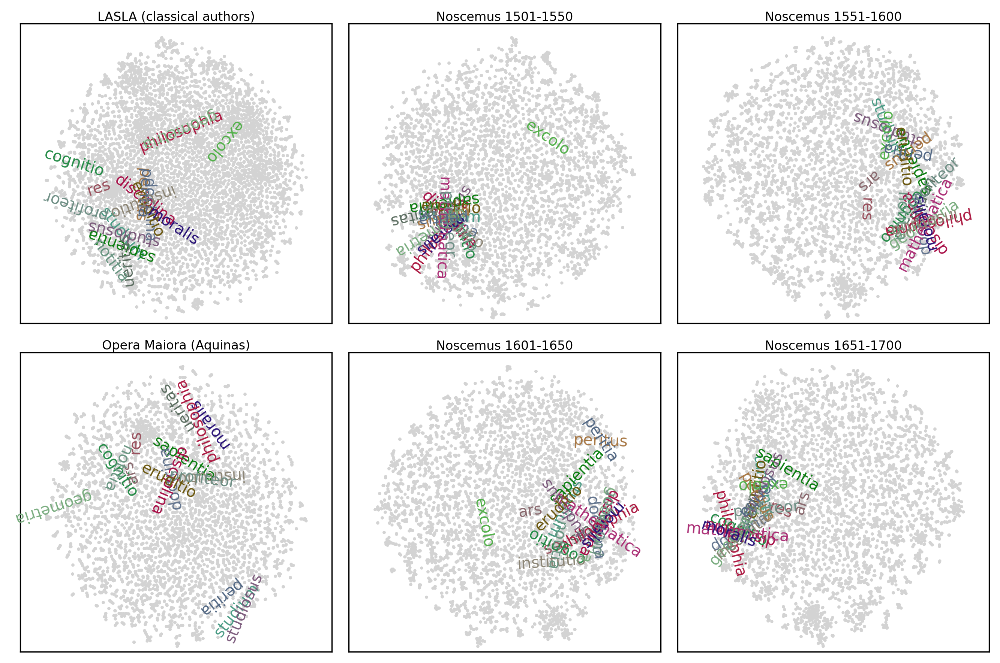

In [154]:
fig, axs = plt.subplots(2,3, figsize=(9, 6), dpi=300, tight_layout=True)

colors_dict = dict([(w, rand_col(seed=n)) for n, w in enumerate(special_words)])

for ax,key in zip(axs.ravel(), ['lasla', '1501-1550', '1551-1600', 'operamaiora', '1601-1650', '1651-1700']):
    kv = vectors_dict[key]
    xs, ys, words = positions_dict[key]
    ax.scatter(xs, ys, s=1, color="lightgrey", zorder=1)
    special_words_filtered = [w for w in special_words if w in words]
    draw_special_words(ax=ax, wordlist=special_words_filtered, rotation=True, color=colors_dict, fontsize=10)
    ax.set_xlim(-0.1,1.1)
    ax.set_ylim(-0.02,1.05)

    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    if key == "lasla":
        title = "LASLA (classical authors)" 
    elif key == "operamaiora":
        title = "Opera Maiora (Aquinas)"
    else:
        title = "Noscemus {}".format(key) 
    ax.set_title(title, fontsize=8, pad=-12)

In [155]:
fig.savefig("../figures/embeddings_scientia.png")

In [156]:
from sklearn.cluster import KMeans

## Colors from clustering

In this example, we base the clusters colors on lasla.

In [158]:
kmeans = KMeans(n_clusters=10, random_state=0, n_init="auto").fit_predict(X=vectors_dict["lasla"].vectors)

In [159]:
clusters_colors_dict = dict([(i, rand_col(seed=i+0)) for i in range(10)])
words_clustercolors_dict = dict([(w, clusters_colors_dict[clust]) for w, clust in zip(vectors_dict["lasla"].index_to_key, kmeans)])

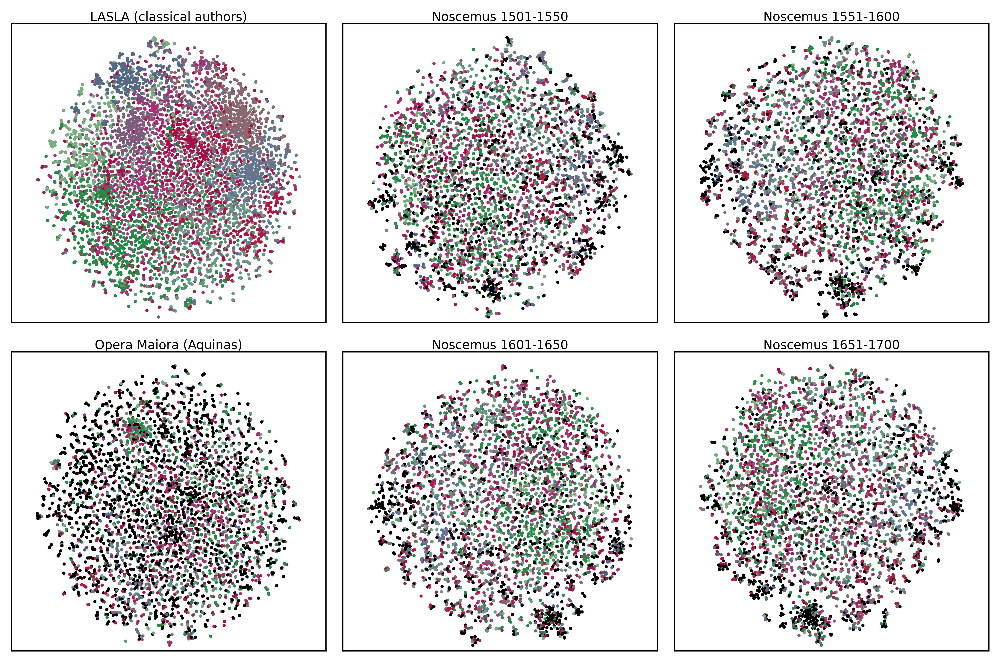

In [161]:
fig, axs = plt.subplots(2,3, figsize=(9, 6), dpi=600, tight_layout=True)

for ax,key in zip(axs.ravel(), ['lasla', '1501-1550', '1551-1600', 'operamaiora', '1601-1650', '1651-1700']):
    kv = vectors_dict[key]
    xs, ys, words = positions_dict[key]
    colors_list=[]
    for w in words:
        try:
            colors_list.append(words_clustercolors_dict[w])
        except:
            colors_list.append("black")
    ax.scatter(xs, ys, s=1, color=colors_list, zorder=1)
    special_words_filtered = [w for w in special_words if w in words]
    #draw_special_words(ax=ax, wordlist=special_words_filtered, rotation=True, color=colors_dict)
    ax.set_xlim(-0.1,1.1)
    ax.set_ylim(-0.02,1.05)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    if key == "lasla":
        title = "LASLA (classical authors)"
    elif key == "operamaiora":
        title = "Opera Maiora (Aquinas)"
    else:
        title = "Noscemus {}".format(key)
    ax.set_title(title, fontsize=8, pad=-12)

In [162]:
fig.savefig("../figures/6embeddings_clustercolors_dots.png")

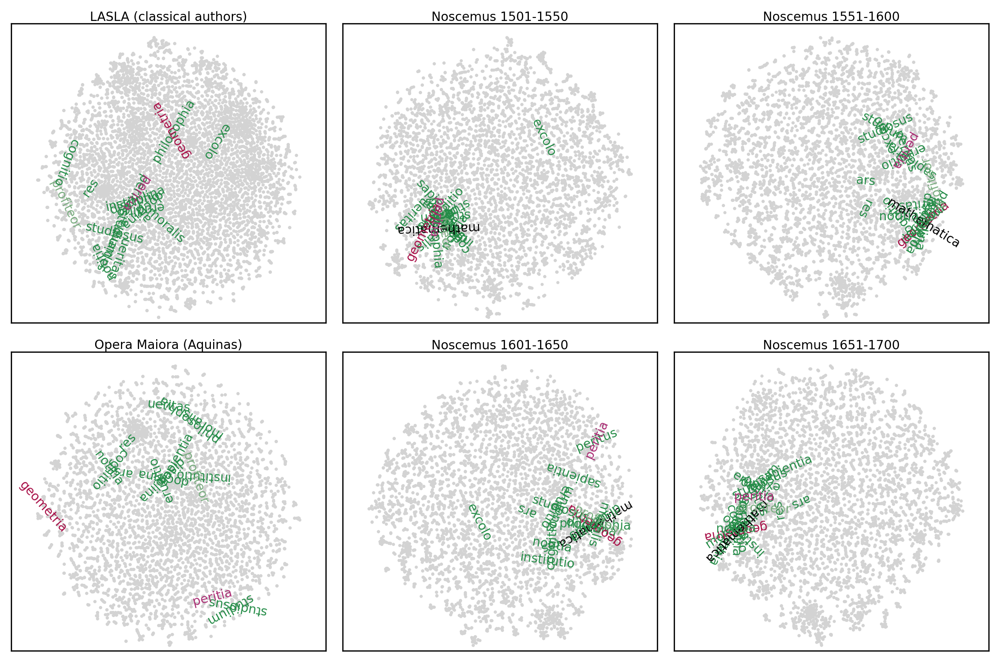

In [163]:
fig, axs = plt.subplots(2,3, figsize=(9, 6), dpi=300, tight_layout=True)

wordcolor_tups = []
for w in special_words:
    try:
        wordcolor_tups.append((w, words_clustercolors_dict[w]))
    except:
        wordcolor_tups.append((w, "black"))
colors_dict = dict(wordcolor_tups)

for ax,key in zip(axs.ravel(), ['lasla', '1501-1550', '1551-1600', 'operamaiora', '1601-1650', '1651-1700']):
    kv = vectors_dict[key]
    xs, ys, words = positions_dict[key]
    ax.scatter(xs, ys, s=1, color="lightgrey", zorder=1)
    special_words_filtered = [w for w in special_words if w in words]
    draw_special_words(ax=ax, wordlist=special_words_filtered, rotation=True, color=colors_dict, fontsize=8)
    ax.set_xlim(-0.1,1.1)
    ax.set_ylim(-0.02,1.05)

    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    if key == "lasla":
        title = "LASLA (classical authors)"
    elif key == "operamaiora":
        title = "Opera Maiora (Aquinas)"
    else:
        title = "Noscemus {}".format(key)
    ax.set_title(title, fontsize=8, pad=-12)

In [164]:
fig.savefig("../figures/6embeddings_clustercolors_scientia.png")

In [165]:
%%capture
for key in vectors_dict.keys():
    kv = vectors_dict[key]
    xs, ys, words = positions_dict[key]
    fig, ax = plt.subplots(1, 1, figsize=(24, 24), dpi=300, tight_layout=True)
    #ax.scatter(xs, ys, s=1, color="lightgrey", zorder=1)

    draw_special_words(ax=ax, wordlist=words, color="random_color", fontsize=5)

    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)

    ax.set_xlim(-0.02,1.02)
    ax.set_ylim(-0.02,1.02)
    fig.savefig("../figures/large_embeddings/embeddings_clustered_{}.png".format(key))

## Measuring semantic change

In [170]:
model = vectors_dict["1501-1550"]
matrix = model.vectors
vocabulary = model.key_to_index
similarity_matrix = cosine_similarity(matrix, matrix)

In [171]:
sim_matrix = pd.DataFrame(similarity_matrix, columns=vocabulary, index=vocabulary)
sim_matrix.head(5)

,dico,liber,pars,facio,habeo,res,possum,locus,uideo,primus,...,china,suecia,idololatra,magnale,uapulo,gratis,inaestimabilis,prorsus,semper,inornatus
dico,1.000000,0.549463,0.489304,0.576257,0.690798,0.560995,0.442806,0.576393,0.724728,0.536051,...,0.329553,0.377444,0.231744,0.372613,0.229817,0.300828,0.269688,0.367927,0.373476,0.421864
liber,0.549463,1.000000,0.375977,0.434462,0.412210,0.405724,0.279468,0.474164,0.451404,0.578373,...,0.271642,0.183644,0.127331,0.214656,0.150848,0.295921,0.292589,0.312046,0.232653,0.317332
pars,0.489304,0.375977,1.000000,0.491244,0.508247,0.331284,0.424226,0.500036,0.448081,0.568957,...,0.336611,0.358139,0.207771,0.207018,0.342603,0.216808,0.215843,0.304179,0.338528,0.293756
facio,0.576257,0.434462,0.491244,1.000000,0.663962,0.517272,0.556214,0.451535,0.665750,0.507610,...,0.275256,0.201097,0.235706,0.168617,0.276592,0.315005,0.315822,0.213253,0.404629,0.304518
habeo,0.690798,0.412210,0.508247,0.663962,1.000000,0.522516,0.466860,0.538960,0.660101,0.502208,...,0.246324,0.381329,0.258871,0.325537,0.327273,0.306002,0.433698,0.378870,0.404188,0.367958


Let's inspect individual row:

In [177]:
sim_matrix.loc["cor"]

dico              0.277651
liber             0.253030
pars              0.401159
facio             0.334252
habeo             0.376184
                    ...   
gratis            0.147336
inaestimabilis    0.174576
prorsus           0.279597
semper            0.305136
inornatus         0.154154
Name: cor, Length: 6005, dtype: float32

Now, if we sort the row values by the similarity score, we simply get the nearest neighbors we inspected above...

In [180]:
sim_matrix.loc["cor"].sort_values(ascending=False)[:10]

cor            1.000000
pulmo          0.660545
uitalis        0.602582
spiritus       0.583934
uentriculus    0.574163
uena           0.571417
cerebrum       0.567642
iecur          0.565984
membrum        0.560416
uenalis        0.553360
Name: cor, dtype: float32

In [183]:
def get_sim_matrix_df(model):
    matrix = model.vectors
    vocabulary = model.key_to_index
    similarity_matrix = cosine_similarity(matrix, matrix)
    sim_matrix = pd.DataFrame(similarity_matrix, columns=vocabulary, index=vocabulary)
    return sim_matrix

Get similarity matrices for two corpora to compare between:

In [189]:
sim_matrix_a = get_sim_matrix_df(vectors_dict["1551-1600"])
sim_matrix_b = get_sim_matrix_df(vectors_dict["1601-1650"])

Measure extent of semantic shift (extent of similarity across two subcorpora) in case of individual term.
Higher values mean less change.

In [196]:
cosine_similarity([sim_matrix_a.loc["geometria"], sim_matrix_b.loc["geometria"]])[0][1]

0.75708574

In [197]:
cosine_similarity([sim_matrix_a.loc["cor"], sim_matrix_b.loc["cor"]])[0][1]

0.85855705

measure the extent of semantic shift for all terms from a predefined vocabulary

In [198]:
vocabulary = sim_matrix_a.columns
sim_scores = []
for term in vocabulary:
    sim_scores.append((term, cosine_similarity([sim_matrix_a.loc[term], sim_matrix_b.loc[term]])[0,1]))

get the words ongoing through the highest semantic shift:

In [202]:
sorted_sim_tuples = sorted(sim_scores, key=lambda tup: tup[1])
sorted_sim_tuples[:50]

[('atramentosa', 0.58856976),
 ('terebra', 0.6234666),
 ('bractea', 0.63295263),
 ('cruso', 0.63393354),
 ('ochras', 0.6341431),
 ('coaequo', 0.6366925),
 ('pyrio', 0.6422768),
 ('jus', 0.64367884),
 ('nitrosa', 0.64617753),
 ('sandaracum', 0.65193194),
 ('malleo', 0.65396523),
 ('cineraceus', 0.6575545),
 ('pota', 0.6577407),
 ('oblino', 0.65805405),
 ('bracteus', 0.65854114),
 ('tam', 0.659517),
 ('flabra', 0.6619512),
 ('ante', 0.6638762),
 ('frigesco', 0.66460586),
 ('exudo', 0.6651529),
 ('sandaraca', 0.66518724),
 ('wasser', 0.66622466),
 ('cortina', 0.6662922),
 ('lamina', 0.6670627),
 ('ancon', 0.6700783),
 ('scamnum', 0.6728118),
 ('ambulatio', 0.6733163),
 ('allido', 0.6733473),
 ('ad', 0.6739878),
 ('iam', 0.674454),
 ('resilio', 0.6751692),
 ('cur', 0.6753331),
 ('plumbago', 0.6753782),
 ('boreas', 0.67578727),
 ('ceruleus', 0.6758421),
 ('squama', 0.6767837),
 ('obliquitas', 0.6770919),
 ('sexangulus', 0.6771634),
 ('tignum', 0.67816174),
 ('gypsum', 0.6783883),
 ('pyrito'

In [209]:
target = "geometria"
[n for n,t in enumerate(sorted_sim_tuples) if t[0]==target]

[732]

In [205]:
# what is a position of a term we are interested in?
target = "cor"
[n for n,t in enumerate(sorted_sim_tuples) if t[0]==target]

[5359]